# Project 1

## Load Packages

In [6]:
import numpy as np
import pandas as pd 
import matplotlib.pyplot as plt 
import seaborn as sns 
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
import time
%matplotlib inline 

In [7]:
data_path = '/Users/fuwang/Documents/Columbia/Fall 2022/fall2022-project1-YuDaoFu/data/philosophy_data.csv'

In [8]:
df = pd.read_csv(data_path)
df.head(5)

,title,author,school,sentence_spacy,sentence_str,original_publication_date,corpus_edition_date,sentence_length,sentence_lowered,tokenized_txt,lemmatized_str
0,Plato - Complete Works,Plato,plato,"What's new, Socrates, to make you leave your ...","What's new, Socrates, to make you leave your ...",-350,1997,125,"what's new, socrates, to make you leave your ...","['what', 'new', 'socrates', 'to', 'make', 'you...","what be new , Socrates , to make -PRON- lea..."
1,Plato - Complete Works,Plato,plato,Surely you are not prosecuting anyone before t...,Surely you are not prosecuting anyone before t...,-350,1997,69,surely you are not prosecuting anyone before t...,"['surely', 'you', 'are', 'not', 'prosecuting',...",surely -PRON- be not prosecute anyone before ...
2,Plato - Complete Works,Plato,plato,The Athenians do not call this a prosecution b...,The Athenians do not call this a prosecution b...,-350,1997,74,the athenians do not call this a prosecution b...,"['the', 'athenians', 'do', 'not', 'call', 'thi...",the Athenians do not call this a prosecution ...
3,Plato - Complete Works,Plato,plato,What is this you say?,What is this you say?,-350,1997,21,what is this you say?,"['what', 'is', 'this', 'you', 'say']",what be this -PRON- say ?
4,Plato - Complete Works,Plato,plato,"Someone must have indicted you, for you are no...","Someone must have indicted you, for you are no...",-350,1997,101,"someone must have indicted you, for you are no...","['someone', 'must', 'have', 'indicted', 'you',...","someone must have indict -PRON- , for -PRON- ..."


Before we officially start doing EDA, let's run some sanity checks over this dataset

In [9]:
print("The number of rows is", df.shape[0]) 

print("The number of features is", df.shape[1]) 
print('\n')

df.info()

The number of rows is 360808
The number of features is 11


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 360808 entries, 0 to 360807
Data columns (total 11 columns):
 #   Column                     Non-Null Count   Dtype 
---  ------                     --------------   ----- 
 0   title                      360808 non-null  object
 1   author                     360808 non-null  object
 2   school                     360808 non-null  object
 3   sentence_spacy             360808 non-null  object
 4   sentence_str               360808 non-null  object
 5   original_publication_date  360808 non-null  int64 
 6   corpus_edition_date        360808 non-null  int64 
 7   sentence_length            360808 non-null  int64 
 8   sentence_lowered           360808 non-null  object
 9   tokenized_txt              360808 non-null  object
 10  lemmatized_str             360808 non-null  object
dtypes: int64(3), object(8)
memory usage: 30.3+ MB


In [10]:
print('The number of duplicated row is', df.duplicated().sum())

# Check missing values: 
df.isna().sum().sort_values(ascending=False)


The number of duplicated row is 0


title                        0
author                       0
school                       0
sentence_spacy               0
sentence_str                 0
original_publication_date    0
corpus_edition_date          0
sentence_length              0
sentence_lowered             0
tokenized_txt                0
lemmatized_str               0
dtype: int64

Thus there's no missing values and no duplicated values in the dataset 

Adding a new feature number_token (Number of tokens) in case in the future we'd like to apply some machine learning models

In [11]:
df['number_token'] = list(map(len,map(eval,df.tokenized_txt)))

## EDA Process 

### Categorical Variable

In [12]:
print('The numeber of unique titles is', df.title.nunique())
print('The numeber of unique authors is', df.author.nunique())
print('The numeber of unique schools is', df.school.nunique())

The numeber of unique titles is 59
The numeber of unique authors is 36
The numeber of unique schools is 13


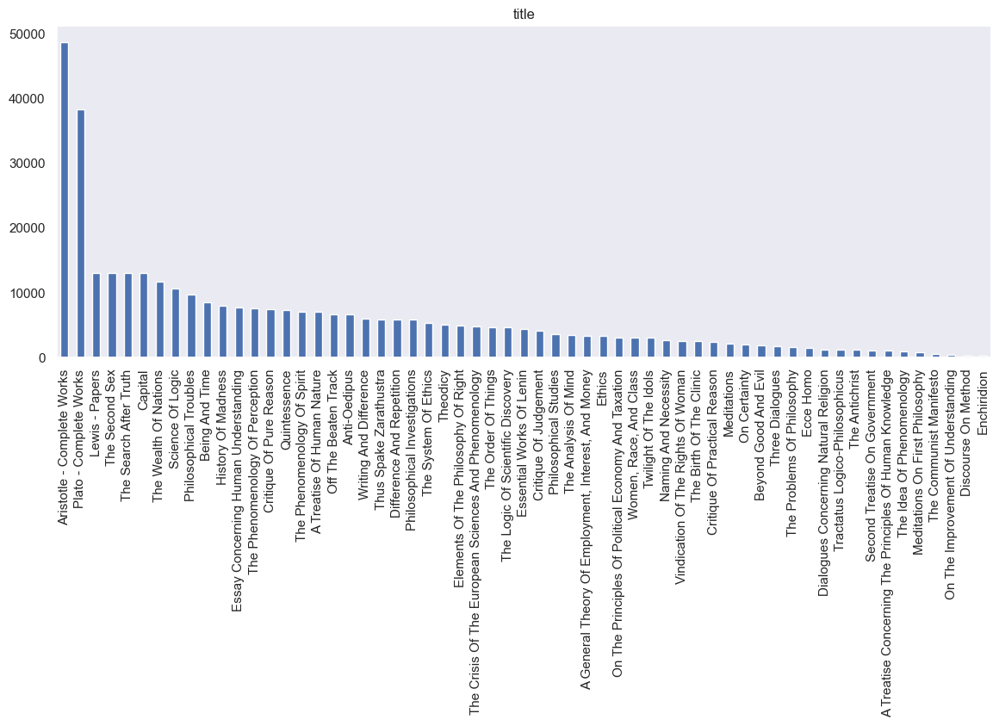

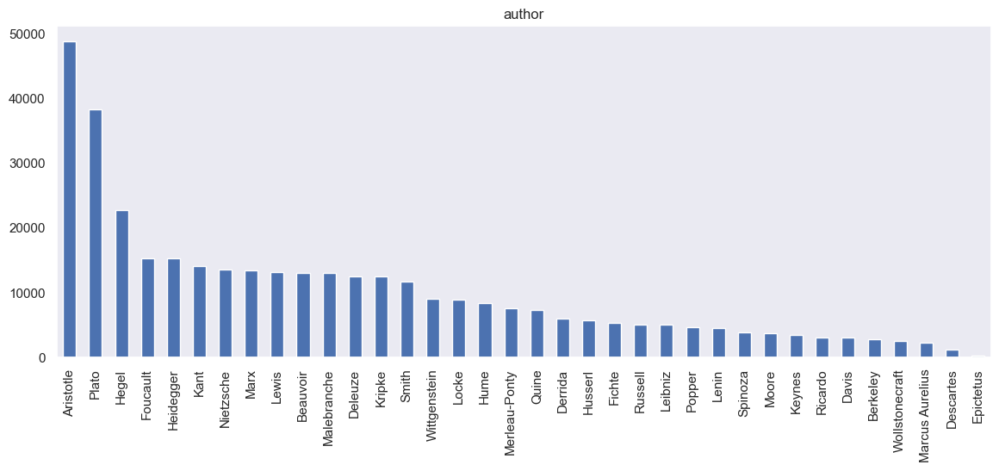

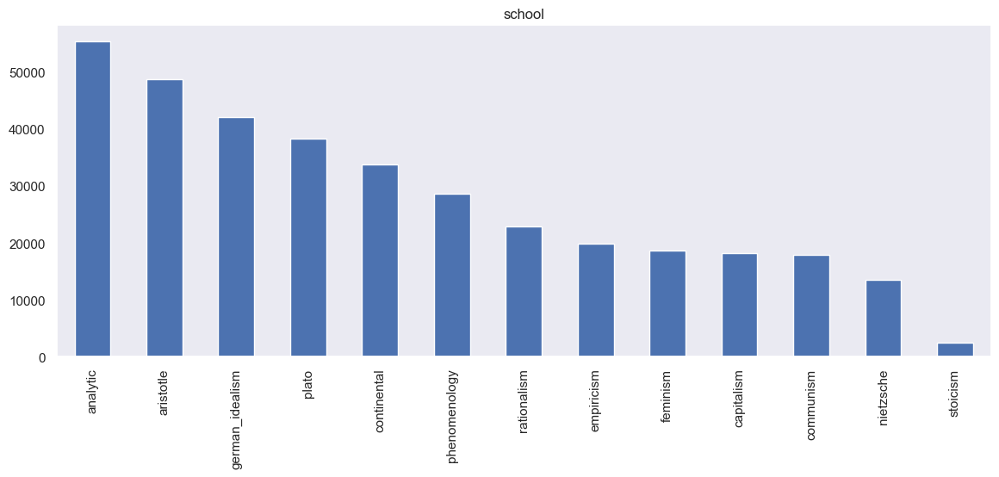

In [13]:
# categorical features
features_cat = ['title', 'author', 'school']

sns.set(font_scale=1)
# plot distributions
for f in features_cat:
    plt.figure(figsize=(14,5))
    df[f].value_counts().plot(kind='bar')
    plt.title(f)
    plt.grid()
    plt.show()

Above is the general view of the distribution for each categorical features

Below we'd like to find out which are the top 10 values corresponding to each feature. Since there are so many distinct values for each categorical features, therefore we will only focus on the top 10 values in each categorical varibales for better visualization and understanding

In [14]:
# top 10 authors
top_author = df.author.value_counts().head(10)
top_author

Aristotle    48779
Plato        38366
Hegel        22700
Foucault     15240
Heidegger    15239
Kant         14128
Nietzsche    13548
Marx         13489
Lewis        13120
Beauvoir     13017
Name: author, dtype: int64

<AxesSubplot:xlabel='author', ylabel='count'>

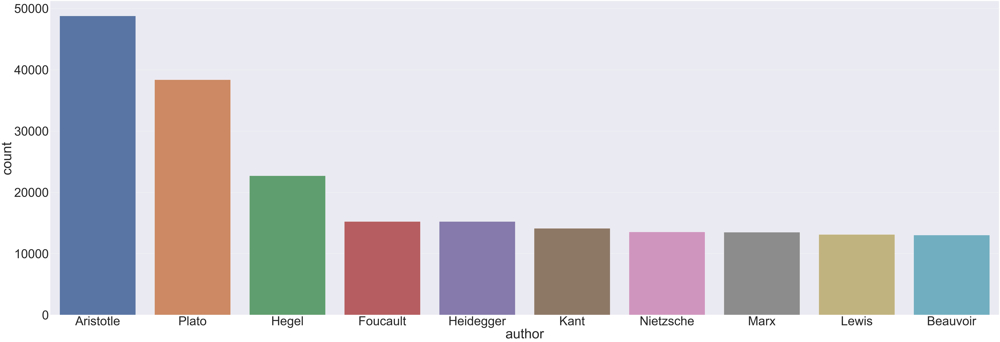

In [15]:
sns.set(font_scale=8)
fig,ax = plt.subplots(1,1,figsize = (120,40))
sns.countplot(data = df,x = 'author',order = df.author.value_counts().iloc[:10].index)

In [16]:
# top 10 schools
top_school = df.school.value_counts().head(10)
top_school

analytic           55425
aristotle          48779
german_idealism    42136
plato              38366
continental        33779
phenomenology      28573
rationalism        22949
empiricism         19931
feminism           18635
capitalism         18194
Name: school, dtype: int64

<AxesSubplot:xlabel='school', ylabel='count'>

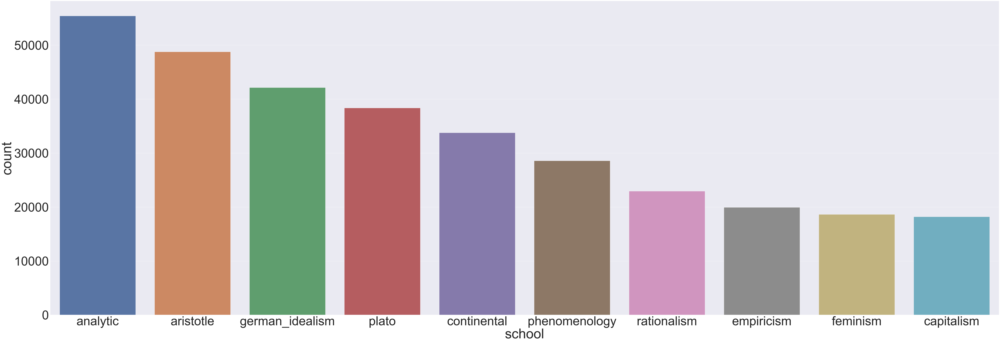

In [17]:
sns.set(font_scale=8)
fig,ax = plt.subplots(1,1,figsize = (120,40))
sns.countplot(data = df,x = 'school',order = df.school.value_counts().iloc[:10].index)

In [18]:
# top 10 most frequent titles
top_title = df.title.value_counts().head(10)
top_title

Aristotle - Complete Works    48779
Plato - Complete Works        38366
Lewis - Papers                13120
The Second Sex                13017
The Search After Truth        12997
Capital                       12996
The Wealth Of Nations         11693
Science Of Logic              10678
Philosophical Troubles         9798
Being And Time                 8505
Name: title, dtype: int64

<AxesSubplot:xlabel='title', ylabel='count'>

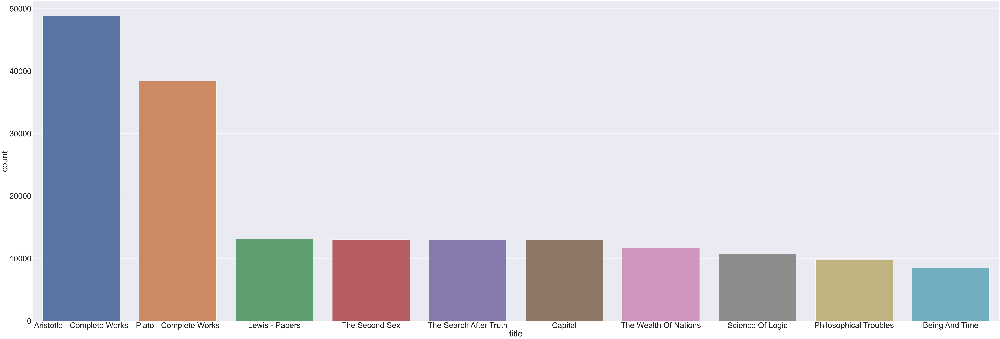

In [19]:
sns.set(font_scale=5)
fig,ax = plt.subplots(1,1,figsize = (120,40))
sns.countplot(data = df,x = 'title',order = df.title.value_counts().iloc[:10].index)

### Numerical Variable

In [20]:
df.describe()

,original_publication_date,corpus_edition_date,sentence_length,number_token
count,360808.000000,360808.000000,360808.000000,360808.000000
mean,1326.800908,1995.155642,150.790964,25.693216
std,951.492193,23.002287,104.822072,17.766261
min,-350.000000,1887.000000,20.000000,0.000000
25%,1641.000000,1991.000000,75.000000,13.000000
50%,1817.000000,2001.000000,127.000000,22.000000
75%,1949.000000,2007.000000,199.000000,34.000000
max,1985.000000,2016.000000,2649.000000,398.000000


count    360808.000000
mean       1326.800908
std         951.492193
min        -350.000000
25%        1641.000000
50%        1817.000000
75%        1949.000000
max        1985.000000
Name: original_publication_date, dtype: float64


(-500.0, 2100.0)

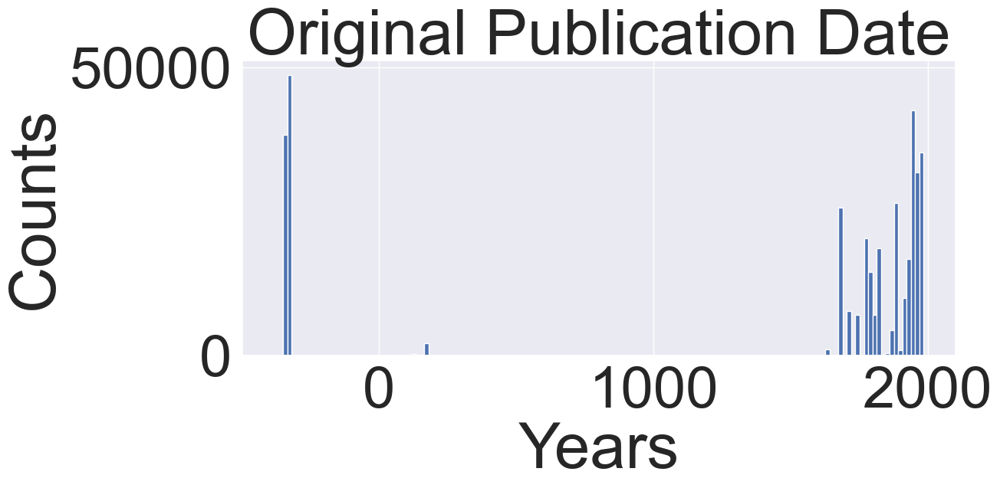

In [21]:
# Original Publication Date
print(df.original_publication_date.describe())

plt.figure(figsize=(12,5))
df.original_publication_date.plot(kind='hist', bins=150)
plt.title('Original Publication Date')
plt.ylabel('Counts')
plt.xlabel('Years')
plt.xlim(-500,2100)

We can see 75% of articles are published after year 1641 

count    360808.000000
mean       1995.155642
std          23.002287
min        1887.000000
25%        1991.000000
50%        2001.000000
75%        2007.000000
max        2016.000000
Name: corpus_edition_date, dtype: float64


Text(0.5, 0, 'Years')

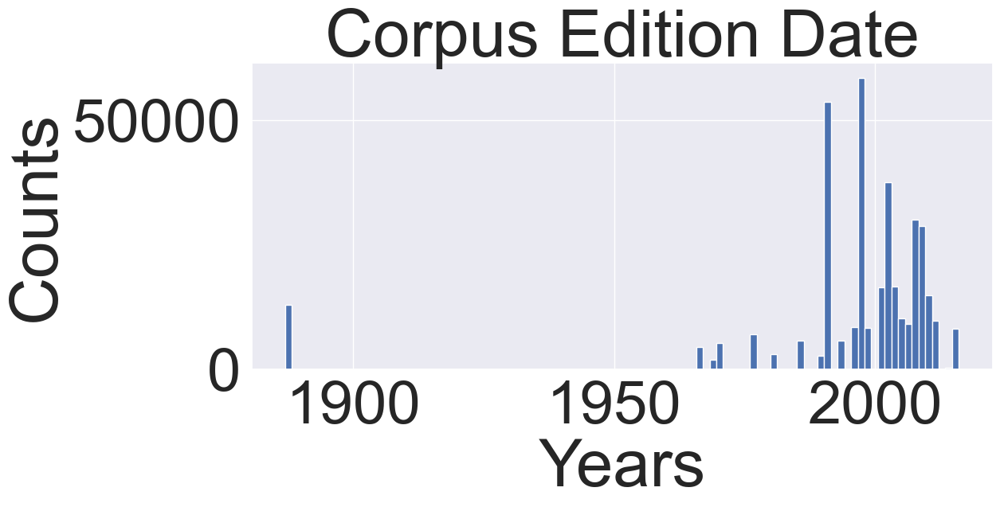

In [22]:
# Corpus edition date
print(df.corpus_edition_date.describe())

plt.figure(figsize=(12,5))
df.corpus_edition_date.plot(kind='hist', bins=100)
plt.title('Corpus Edition Date')
plt.ylabel('Counts')
plt.xlabel('Years')

From the graph above, we can see that 75% of corpus was edited after year 1991

count    360808.000000
mean        150.790964
std         104.822072
min          20.000000
25%          75.000000
50%         127.000000
75%         199.000000
max        2649.000000
Name: sentence_length, dtype: float64


Text(0, 0.5, 'Counts')

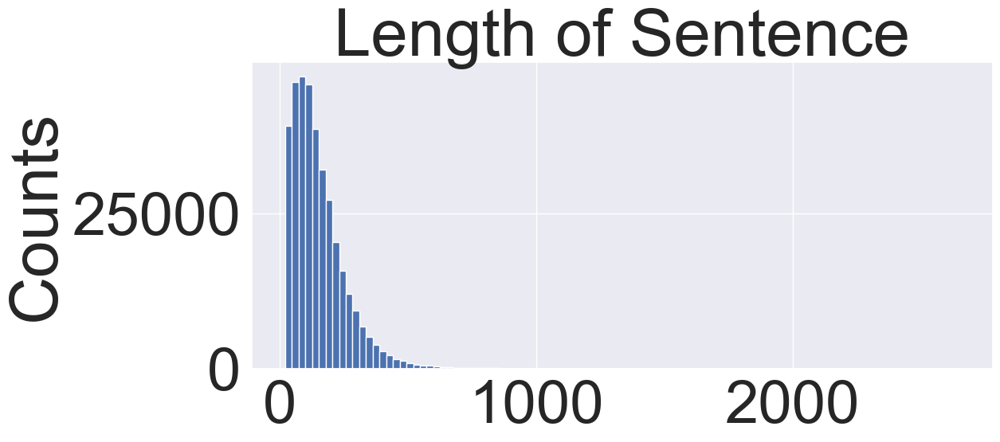

In [23]:
# Sentence Length
print(df.sentence_length.describe())

plt.figure(figsize=(12,5))
df.sentence_length.plot(kind='hist', bins=100)
plt.title('Length of Sentence')
plt.ylabel('Counts')


The original distribution of the length of sentence is distributed left skewed

Text(0, 0.5, 'Counts')

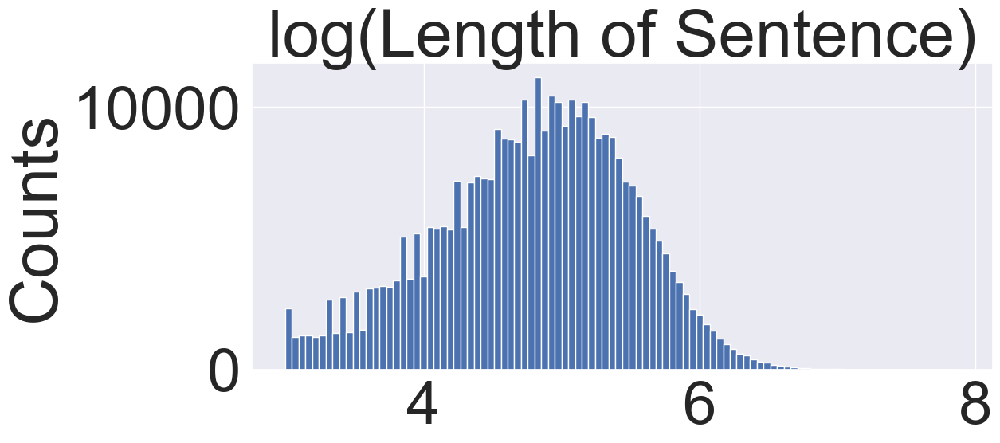

In [24]:
plt.figure(figsize=(12,5))
np.log(df.sentence_length).plot(kind='hist', bins=100)
plt.title('log(Length of Sentence)')
plt.ylabel('Counts')


After log transformation, the distribution of lenght of sentence is roughly more like a normal distribution now

count    360808.000000
mean         25.693216
std          17.766261
min           0.000000
25%          13.000000
50%          22.000000
75%          34.000000
max         398.000000
Name: number_token, dtype: float64


Text(0, 0.5, 'Counts')

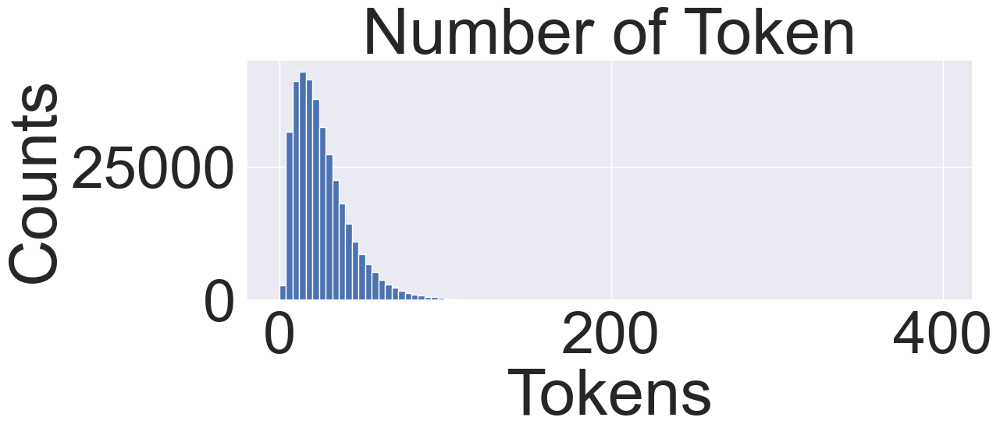

In [25]:
# Number of Token
print(df.number_token.describe())

plt.figure(figsize=(12,4))
df.number_token.plot(kind='hist', bins=100)
plt.title('Number of Token')
plt.xlabel('Tokens')
plt.ylabel('Counts')



Transform the top 10 values for each category to be in list form

In [26]:
author = top_author.index.to_list()

In [27]:
school = top_school.index.to_list()

In [28]:
title = top_title.index.to_list()

In [29]:
author_df = df.loc[df['author'].isin(author)]

In [30]:
school_df = df.loc[df['school'].isin(school)]

In [31]:
title_df = df.loc[df['title'].isin(title)]

Text(0.5, 1.0, 'Sentence Length - By Author')

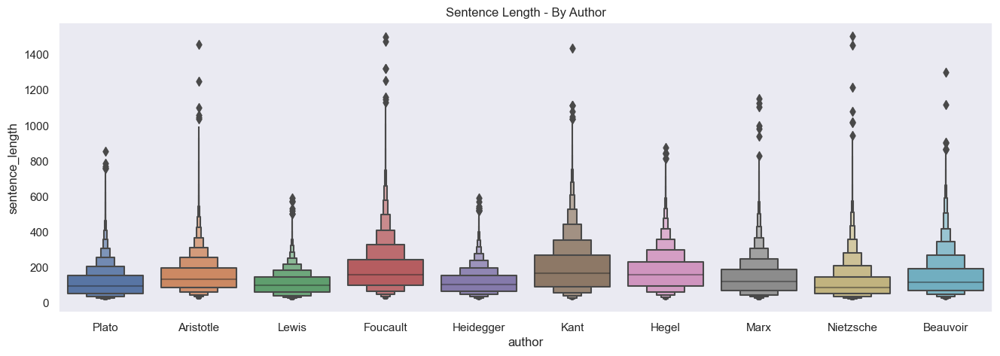

In [32]:
# plot sentence length split by author
plt.figure(figsize=(16,5))
sns.set(font_scale=1)
plt.grid()
sns.boxenplot(x='author', y='sentence_length', data=author_df)
plt.title('Sentence Length - By Author')


Text(0.5, 1.0, 'Sentence Length - By School')

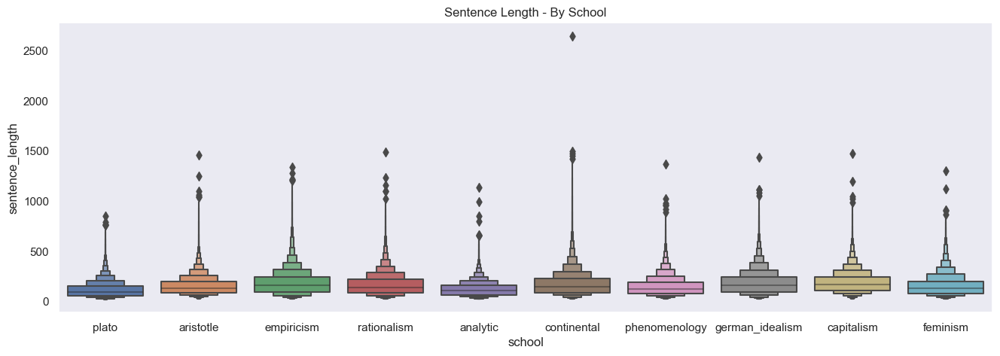

In [33]:
# plot sentence length split by school
plt.figure(figsize=(16,5))
sns.set(font_scale=1)
plt.grid()
sns.boxenplot(x='school', y='sentence_length', data=school_df)
plt.title('Sentence Length - By School')


Text(0.5, 1.0, 'Sentence Length - By Title')

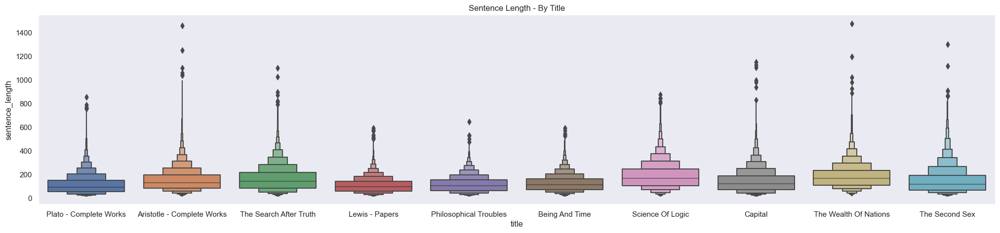

In [34]:
# plot sentence length split by title
plt.figure(figsize=(25,5))
sns.set(font_scale=1)
plt.grid()
sns.boxenplot(x='title', y='sentence_length', data=title_df)
plt.title('Sentence Length - By Title')

### Analyzing data by different grouping

In [35]:
df.groupby(by=['school','author','title']).mean().round(2) # Check out the numerical data by different grouping 

original_publication_date  \
school          author          title                                                                           
analytic        Kripke          Naming And Necessity                                                   1972.0   
                                Philosophical Troubles                                                 1975.0   
                Lewis           Lewis - Papers                                                         1985.0   
                Moore           Philosophical Studies                                                  1910.0   
                Popper          The Logic Of Scientific Discovery                                      1959.0   
                Quine           Quintessence                                                           1950.0   
                Russell         The Analysis Of Mind                                                   1921.0   
                                The Problems Of Philosophy                                             1912.0   
                Wittgenstein    On Certainty                                                           1950.0   
                                Philosophical Investigations                                           1953.0   
                                Tractatus Logico-Philosophicus                                         1921.0   
aristotle       Aristotle       Aristotle - Complete Works                                             -320.0   
capitalism      Keynes          A General Theory Of Employment, Interest, And M...                     1936.0   
                Ricardo         On The Principles Of Political Economy And Taxa...                     1817.0   
                Smith           The Wealth Of Nations                                                  1776.0   
communism       Lenin           Essential Works Of Lenin                                               1862.0   
                Marx            Capital                                                                1883.0   
                                The Communist Manifesto                                                1848.0   
continental     Deleuze         Anti-Oedipus                                                           1972.0   
                                Difference And Repetition                                              1968.0   
                Derrida         Writing And Difference                                                 1967.0   
                Foucault        History Of Madness                                                     1961.0   
                                The Birth Of The Clinic                                                1963.0   
                                The Order Of Things                                                    1966.0   
empiricism      Berkeley        A Treatise Concerning The Principles Of Human K...                     1710.0   
                                Three Dialogues                                                        1713.0   
                Hume            A Treatise Of Human Nature                                             1739.0   
                                Dialogues Concerning Natural Religion                                  1779.0   
                Locke           Essay Concerning Human Understanding                                   1689.0   
                                Second Treatise On Government                                          1689.0   
feminism        Beauvoir        The Second Sex                                                         1949.0   
                Davis           Women, Race, And Class                                                 1981.0   
                Wollstonecraft  Vindication Of The Rights Of Woman                                     1792.0   
german_idealism Fichte          The System Of Ethics                                                   1798.0   
                

In [280]:
pd.DataFrame(df.groupby(by=['school','author','title'])['title'].count())

title
school          author          title                                                    
analytic        Kripke          Naming And Necessity                                 2681
                                Philosophical Troubles                               9798
                Lewis           Lewis - Papers                                      13120
                Moore           Philosophical Studies                                3668
                Popper          The Logic Of Scientific Discovery                    4678
                Quine           Quintessence                                         7373
                Russell         The Analysis Of Mind                                 3513
                                The Problems Of Philosophy                           1560
                Wittgenstein    On Certainty                                         1984
                                Philosophical Investigations                         5838
                                Tractatus Logico-Philosophicus                       1212
aristotle       Aristotle       Aristotle - Complete Works                          48779
capitalism      Keynes          A General Theory Of Employment, Interest, And M...   3411
                Ricardo         On The Principles Of Political Economy And Taxa...   3090
                Smith           The Wealth Of Nations                               11693
communism       Lenin           Essential Works Of Lenin                             4469
                Marx            Capital                                             12996
                                The Communist Manifesto                               493
continental     Deleuze         Anti-Oedipus                                         6679
                                Difference And Repetition                            5861
                Derrida         Writing And Difference                               5999
                Foucault        History Of Madness                                   8033
                                The Birth Of The Clinic                              2518
                                The Order Of Things                                  4689
empiricism      Berkeley        A Treatise Concerning The Principles Of Human K...   1040
                                Three Dialogues                                      1694
                Hume            A Treatise Of Human Nature                           7047
                                Dialogues Concerning Natural Religion                1265
                Locke           Essay Concerning Human Understanding                 7742
                                Second Treatise On Government                        1143
feminism        Beauvoir        The Second Sex                                      13017
                Davis           Women, Race, And Class                               3059
                Wollstonecraft  Vindication Of The Rights Of Woman                   2559
german_idealism Fichte          The System Of Ethics                                 5308
                Hegel           Elements Of The Philosophy Of Right                  4923
                                Science Of Logic                                    10678
                                The Phenomenology Of Spirit                          7099
                Kant            Critique Of Judgement                                4204
                                Critique Of Practical Reason                         2452
                                Critique Of Pure Reason                              7472
nietzsche       Nietzsche       Beyond Good And Evil                                 1906
                                Ecce Homo                                            1504
                                The Antichrist                                       1170
                                Th

### WordClouds

Here we will be interested in the top 5 most frequent vairables in each category

In [286]:
top_author = df.author.value_counts().head(5)
top_school = df.school.value_counts().head(5)
top_title = df.title.value_counts().head(5)

In [287]:
author = top_author.index.to_list()
school = top_school.index.to_list()
title = top_title.index.to_list()

In [288]:
stopwords = set(STOPWORDS) # remove stopwords for our WordCloud

Author =  ARISTOTLE :


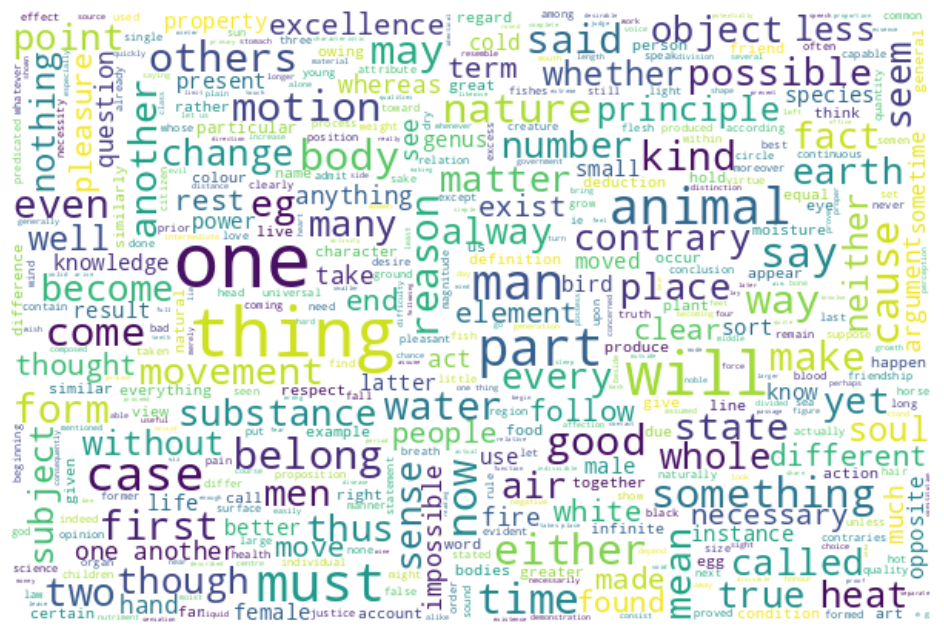

Author =  PLATO :


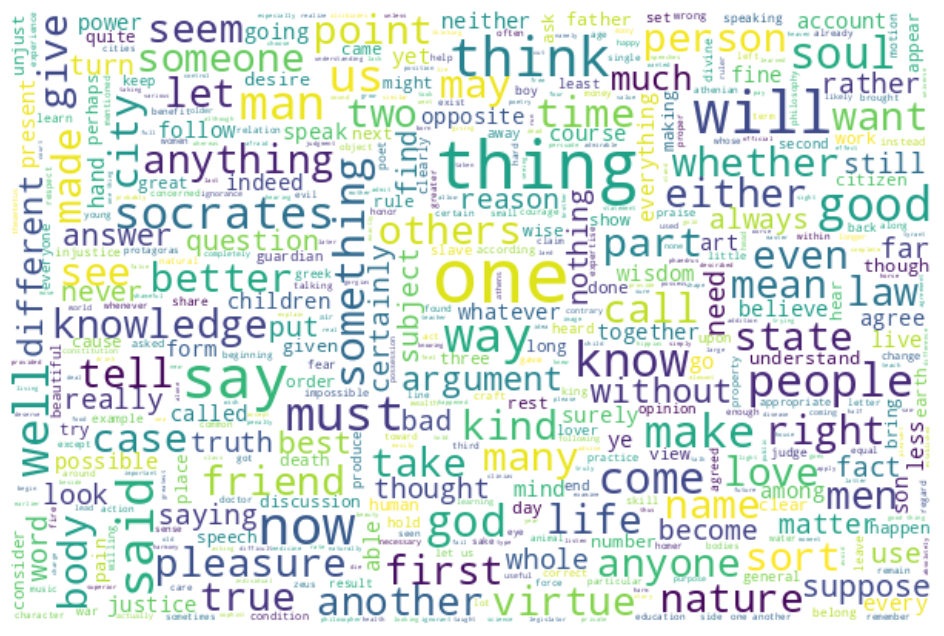

Author =  HEGEL :


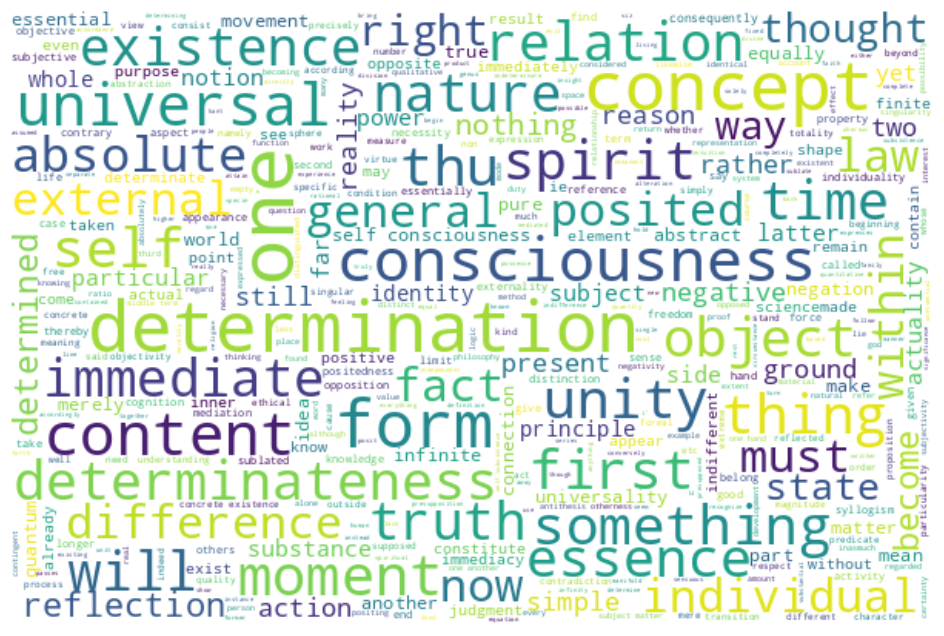

Author =  FOUCAULT :


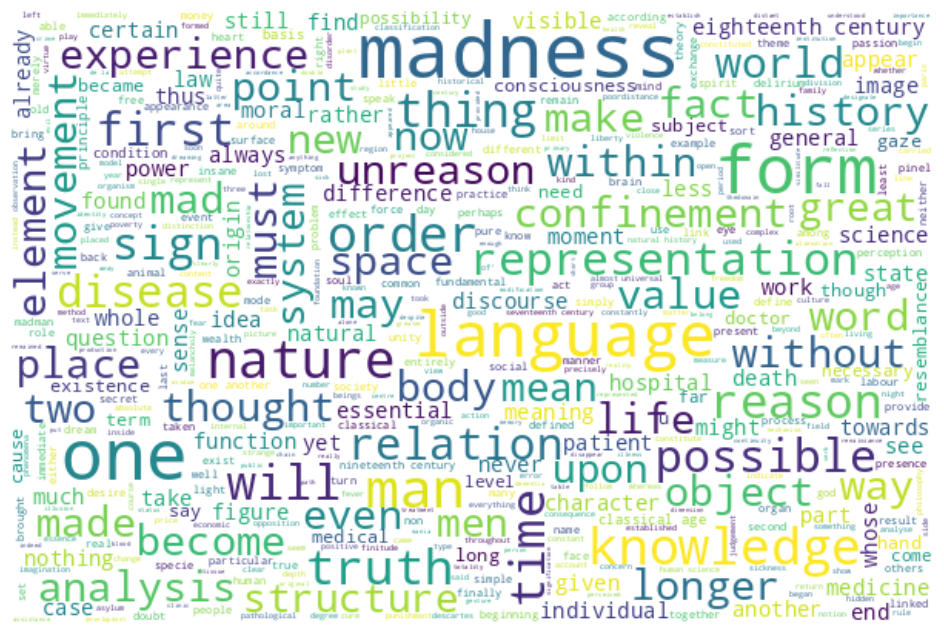

Author =  HEIDEGGER :


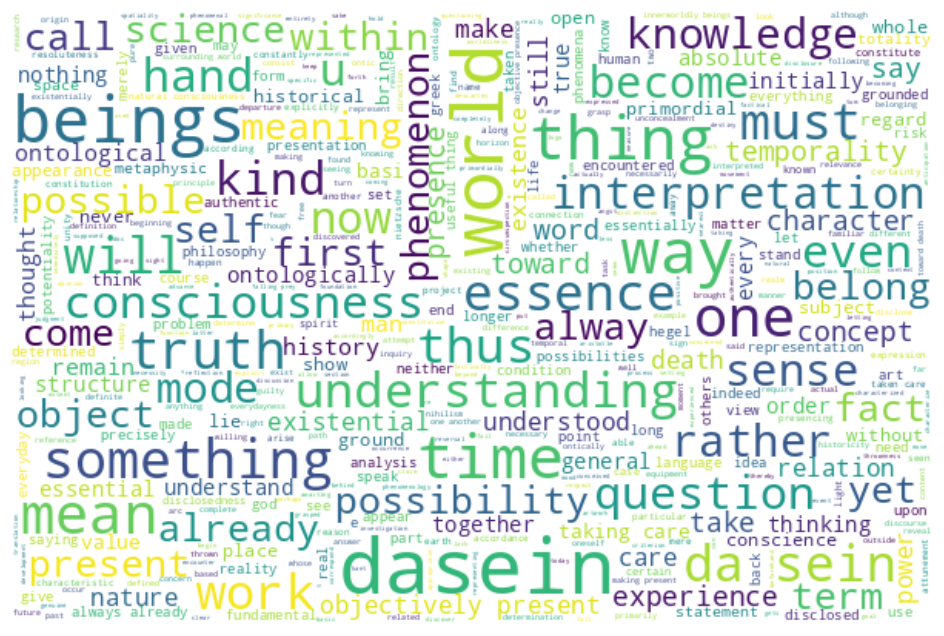

Elapsed time:  12.61


In [289]:
 t1 = time.time()
for au in author:
    df_temp = df[df.author==au]
    
    print('Author = ', au.upper(), ':')
    
    # render wordcloud
    text = " ".join(txt for txt in df_temp.sentence_lowered)
    wordcloud = WordCloud(stopwords=stopwords, max_font_size=50, max_words=500,
                          width = 600, height = 400,
                          background_color="white").generate(text)
    plt.figure(figsize=(12,8))
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis("off")
    plt.show()
t2 = time.time()
print('Elapsed time: ', np.round(t2-t1,2))

School =  ANALYTIC :


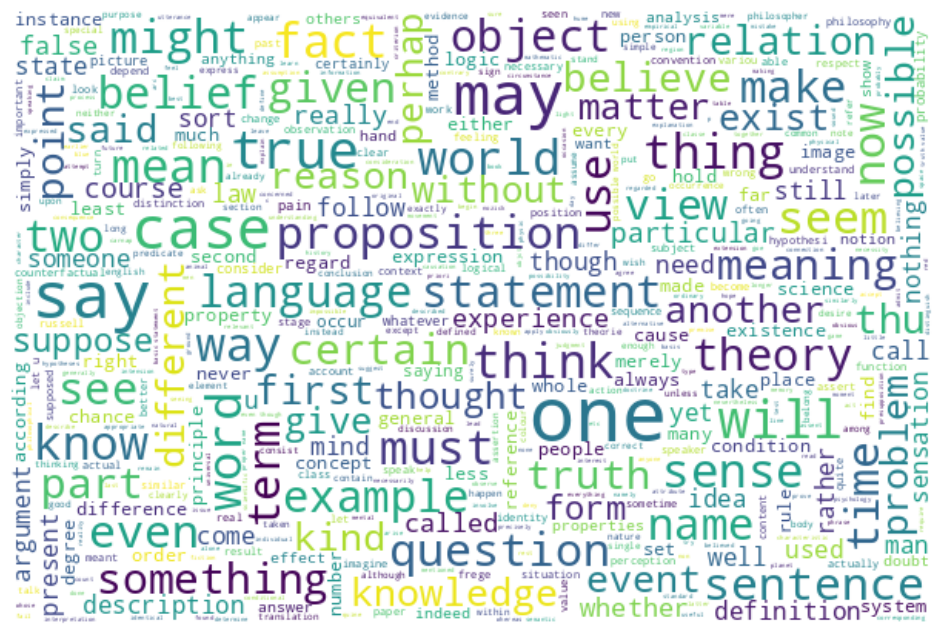

School =  ARISTOTLE :


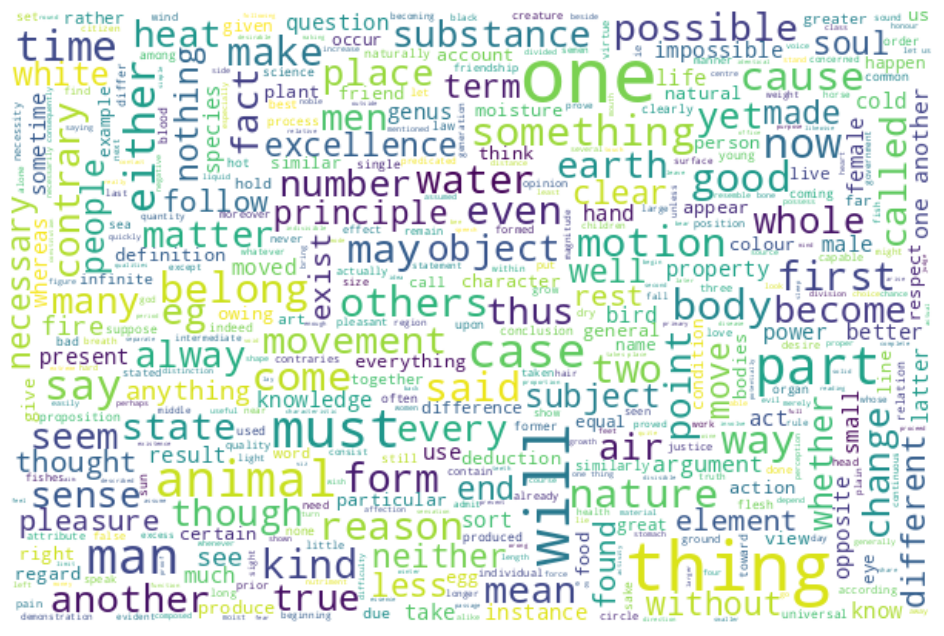

School =  GERMAN_IDEALISM :


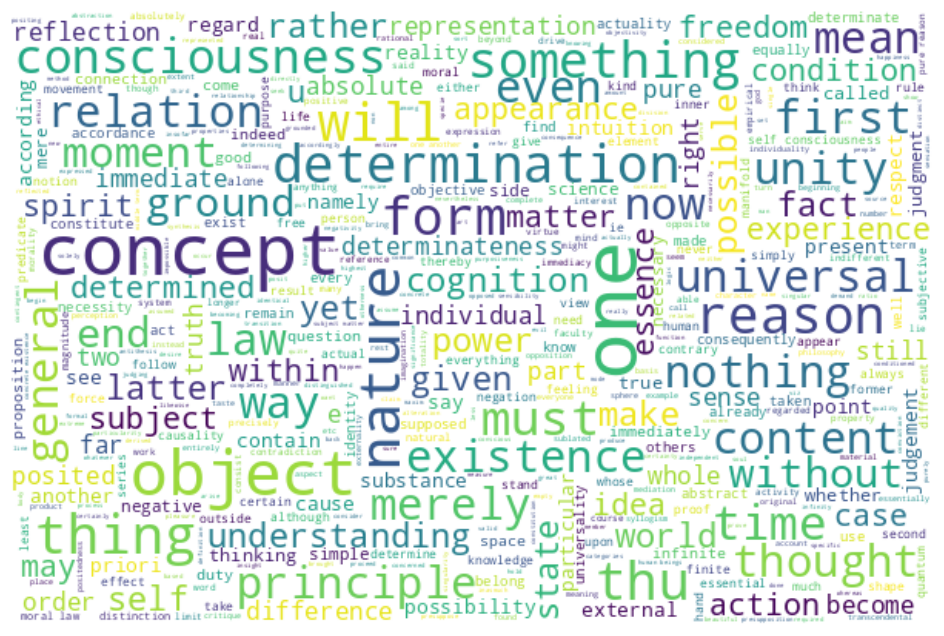

School =  PLATO :


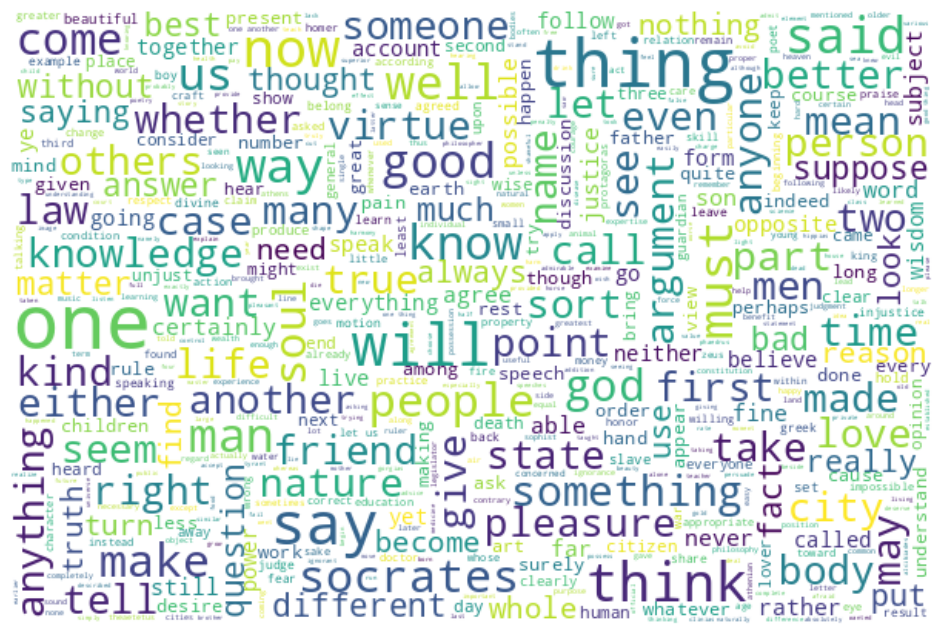

School =  CONTINENTAL :


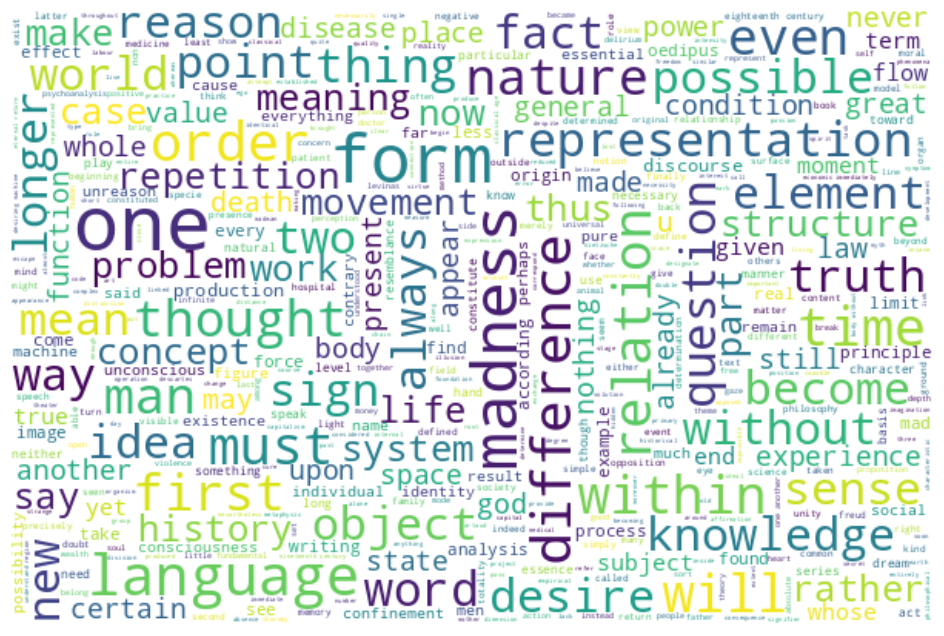

Elapsed time:  16.54


In [290]:
t1 = time.time()
for sc in school:
    df_temp = df[df.school==sc]
    
    print('School = ', sc.upper(), ':')
    
    # render wordcloud
    text = " ".join(txt for txt in df_temp.sentence_lowered)
    wordcloud = WordCloud(stopwords=stopwords, max_font_size=50, max_words=500,
                          width = 600, height = 400,
                          background_color="white").generate(text)
    plt.figure(figsize=(12,8))
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis("off")
    plt.show()
t2 = time.time()
print('Elapsed time: ', np.round(t2-t1,2))

Title =  ARISTOTLE - COMPLETE WORKS :


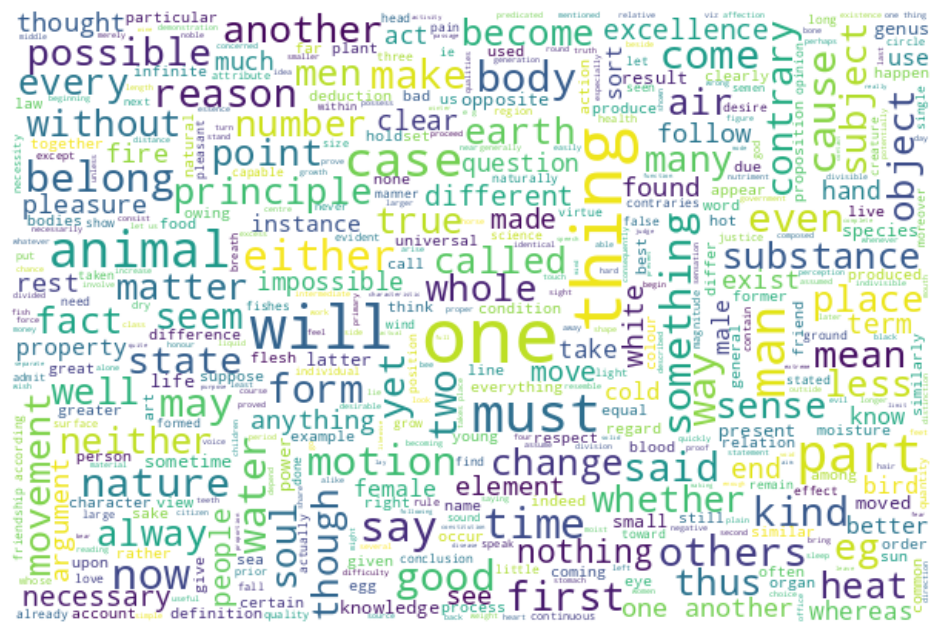

Title =  PLATO - COMPLETE WORKS :


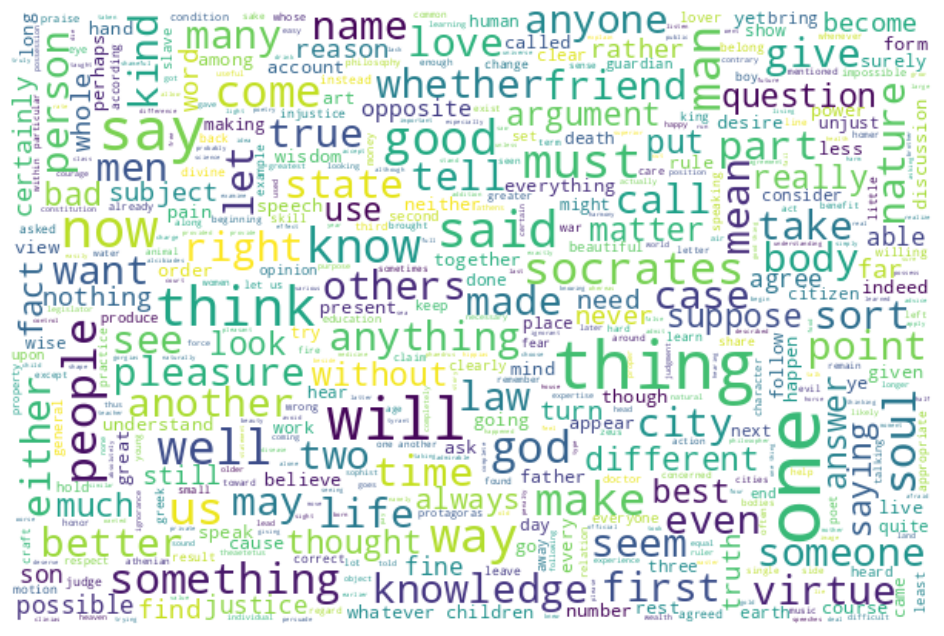

Title =  LEWIS - PAPERS :


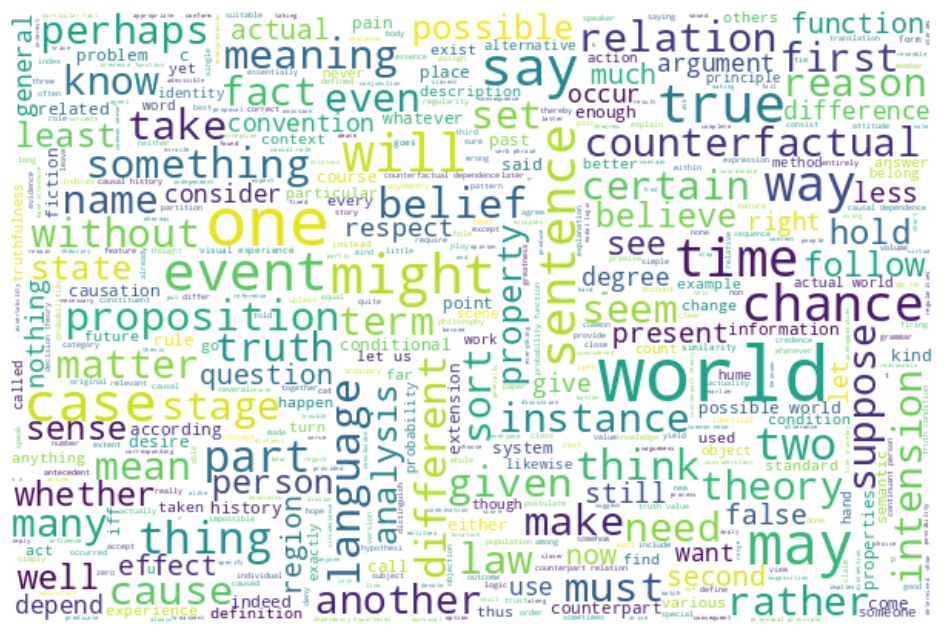

Title =  THE SECOND SEX :


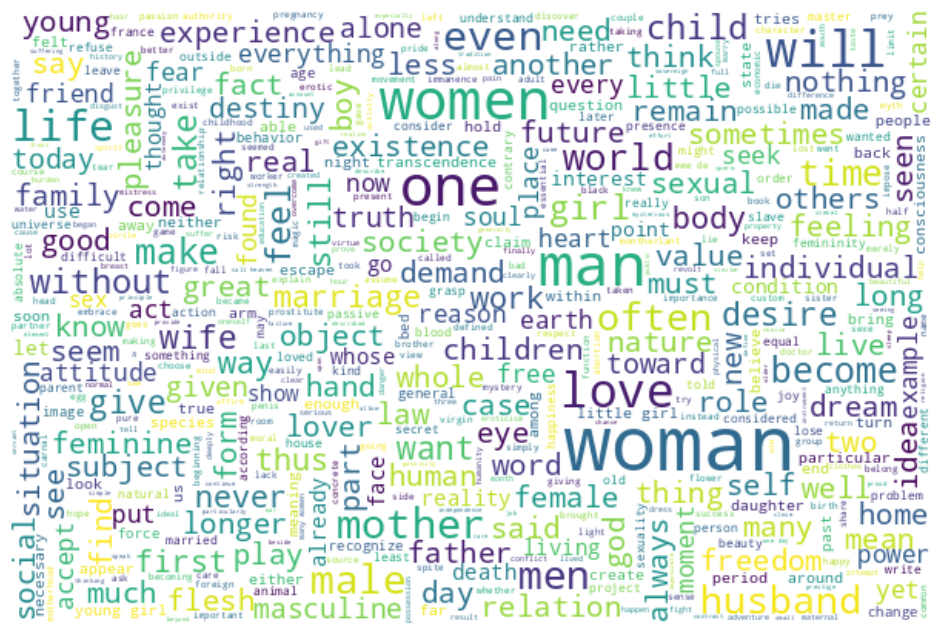

Title =  THE SEARCH AFTER TRUTH :


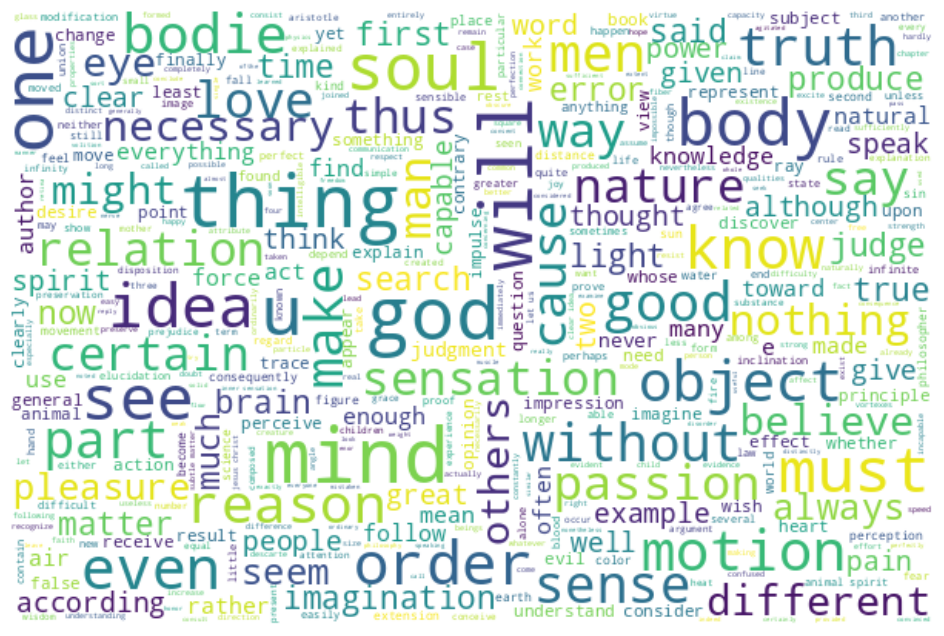

Elapsed time:  11.75


In [291]:
t1 = time.time()
for ti in title:
    df_temp = df[df.title==ti]
    
    print('Title = ', ti.upper(), ':')
    
    # render wordcloud
    text = " ".join(txt for txt in df_temp.sentence_lowered)
    wordcloud = WordCloud(stopwords=stopwords, max_font_size=50, max_words=500,
                          width = 600, height = 400,
                          background_color="white").generate(text)
    plt.figure(figsize=(12,8))
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis("off")
    plt.show()
t2 = time.time()
print('Elapsed time: ', np.round(t2-t1,2))

## NLP Analysis 

We'd like to know each corpus corresponding to which philphilosophy school, and building such a lda model contributes to future purpose like building a recommendation system. 

Now let's do some analysis towards corpus

In [251]:
corpus = df.sentence_lowered
from sklearn.feature_extraction.text import CountVectorizer
cvect = CountVectorizer(lowercase=True,    # default, transform all docs to lowercase
                        ngram_range=(1,1), # default, only unigrams
                        min_df=1,          # default, keep all terms
                        max_df=1.0,        # default, keep all terms
                       )
X_cv = cvect.fit_transform(corpus)
X_cv.shape

(360808, 90319)

In [276]:
from sklearn.feature_extraction.text import TfidfVectorizer

tfidfvect = TfidfVectorizer(stop_words=stopwords,norm='l2') # by default, also doing l2 normalization, 
                                                            # also drop stopwords

X_tfidf = tfidfvect.fit_transform(corpus)
sorted(tfidfvect.vocabulary_.items(),key=lambda x: x[1])[:5]

[('aa', 0),
 ('aagravatlllilllllm', 1),
 ('aaion', 2),
 ('aaions', 3),
 ('aaiotzes', 4)]

In [254]:
feature_names = tfidfvect.get_feature_names()
print(feature_names[:10])
print(feature_names[-10:])

['aa', 'aagravatlllilllllm', 'aaion', 'aaions', 'aaiotzes', 'aaivity', 'aala', 'aances', 'aappearances', 'aardvark']
['ﬂuctuations', 'ﬂuid', 'ﬂuidity', 'ﬂuids', 'ﬂurry', 'ﬂute', 'ﬂuttering', 'ﬂux', 'ﬂy', 'ﬂying']


/opt/anaconda3/envs/W4111/lib/python3.9/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


In [255]:
from sklearn.decomposition import LatentDirichletAllocation

# create model with 20 topics
lda = LatentDirichletAllocation(n_components=df.school.nunique(),  # the number of topics (59 as there are 59 different topics)
                                n_jobs=-1,        # use all cpus
                                random_state=123) # for reproducability

# learn phi (lda.components_) and theta (X_lda)
X_lda = lda.fit_transform(X_tfidf)

In [278]:
np.round(X_lda[1],2) # lda representation of document 1

array([0.02, 0.02, 0.02, 0.49, 0.02, 0.02, 0.02, 0.02, 0.02, 0.24, 0.02,
       0.02, 0.02])

In [257]:
df.iloc[[0]]

,title,author,school,sentence_spacy,sentence_str,original_publication_date,corpus_edition_date,sentence_length,sentence_lowered,tokenized_txt,lemmatized_str,number_token
0,Plato - Complete Works,Plato,plato,"What's new, Socrates, to make you leave your ...","What's new, Socrates, to make you leave your ...",-350,1997,125,"what's new, socrates, to make you leave your ...","['what', 'new', 'socrates', 'to', 'make', 'you...","what be new , Socrates , to make -PRON- lea...",23


In [265]:
np.argsort(X_lda[0])[::-1][:5] # the top 5 schools of document 0

array([ 3,  9,  6, 11,  1])

In [259]:
df.iloc[[1]]

,title,author,school,sentence_spacy,sentence_str,original_publication_date,corpus_edition_date,sentence_length,sentence_lowered,tokenized_txt,lemmatized_str,number_token
1,Plato - Complete Works,Plato,plato,Surely you are not prosecuting anyone before t...,Surely you are not prosecuting anyone before t...,-350,1997,69,surely you are not prosecuting anyone before t...,"['surely', 'you', 'are', 'not', 'prosecuting',...",surely -PRON- be not prosecute anyone before ...,12


In [266]:
np.argsort(X_lda[1])[::-1][:5] # the top 5 schools of document 1

array([ 3,  9,  1,  0, 11])

In [269]:
df.iloc[[100]]

,title,author,school,sentence_spacy,sentence_str,original_publication_date,corpus_edition_date,sentence_length,sentence_lowered,tokenized_txt,lemmatized_str,number_token
100,Plato - Complete Works,Plato,plato,"I do not know yet, but you will obviously show...","I do not know yet, but you will obviously show...",-350,1997,76,"i do not know yet, but you will obviously show...","['do', 'not', 'know', 'yet', 'but', 'you', 'wi...","-PRON- do not know yet , but -PRON- will obvi...",16


In [268]:
np.argsort(X_lda[100])[::-1][:5] # the top 5 schools of document 100

array([12,  1,  3,  7,  5])

In [270]:
# a utility function to print out the most likely terms for each topic
def print_top_words(model, feature_names, n_top_words):
    for topic_idx, topic in enumerate(model.components_):
        message = "School {:#2d}: ".format(topic_idx)
        message += ", ".join([feature_names[i]
                             for i in topic.argsort()[:-n_top_words - 1:-1]])
        print(message)

In [273]:
print_top_words(lda,feature_names,7) # top 7 words for each school 

School  0: value, labour, money, price, quantity, commodities, upon
School  1: say, know, socrates, think, said, don, one
School  2: water, heat, cold, black, air, women, white
School  3: will, one, men, people, must, us, well
School  4: theory, statements, logic, statement, one, way, probability
School  5: reason, god, nature, will, one, us, good
School  6: world, madness, one, language, history, time, experience
School  7: one, sense, true, sentence, belief, case, may
School  8: capital, production, labour, rate, land, will, price
School  9: de, la, ye, feet, pp, des, et
School 10: self, consciousness, concept, one, something, existence, form
School 11: man, good, one, woman, love, will, men
School 12: one, things, ideas, thing, must, will, two


Need explanation why we wanna do LDA (principle)

https://www.youtube.com/watch?v=Cpt97BpI-t4&ab_channel=BhaveshBhatt

### Why we want to use LDA

Latent Dirichlet Allocation (LDA) is a topic model that generates topics based on word frequency from a set of documents.

LDA is particularly useful for finding reasonably accurate mixtures of topics within a given document 